# Compare the v3.2 recalibrated SDSS Stripe82 catalog 
# and the DES catalog

### use the SDSS g-i color and linear interpolation for bandpass transformations 

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [3]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [17]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<a id='dataTools'></a>

### Helper Tools

In [ ]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [12]:
### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches):
    matches['dra'] = (matches['ra']-matches['raDES'])*3600
    matches['ddec'] = (matches['dec']-matches['decDES'])*3600
    ra = matches['ra'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    matches['dg'] = matches['g_mMed'] - matches['gDES'] 
    matches['dr'] = matches['r_mMed'] - matches['rDES'] 
    matches['di'] = matches['i_mMed'] - matches['iDES'] 
    matches['dz'] = matches['z_mMed'] - matches['zDES'] 
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    matches['dgr'] = matches['dg'] - matches['dr'] 
    matches['dri'] = matches['dr'] - matches['di'] 
    matches['diz'] = matches['di'] - matches['dz'] 
    matches['drz'] = matches['dr'] - matches['dz'] 
    matches['dgi'] = matches['dg'] - matches['di'] 
    return

In [ ]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    # this is where the useable range of color specified by Xstr is defined
    # it's really a hack - these limits should be passed via kw... 
    xMin = 0.5
    xMax = 3.1
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, xMin, xMax, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    # THERE IS NO ANALYTIC COLOR TERM: linear interpolation of the binned medians! 
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    # the following line corrects the trend given by the binned medians 
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    # note that we only use the restricted range of color for ZP analysis
    # 0.3 mag limit is to reject gross outliers
    goodC = d[(np.abs(d['colorresid'])<0.3)&(xVec>xMin)&(xVec<xMax)]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-45, "Xmax":47, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-43, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-1.26, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # r SDSS
    print('-----------')
    print(' stats for SDSS r binning medians:')
    plotName = plotNameRoot + '_rmag.png'    
    kwOC = {"Xstr":'r_mMed', "Xmin":14.3, "Xmax":22.2, "Xlabel":'SDSS r (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":14.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    print('------------------------------------------------------------------')
   

<a id='dataReading'></a>

### Define paths and catalogs 

In [5]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/Data"
# Doug's match of v3.2 and DES catalog  
DEScatalog = ZIdataDir + "/" + "match_stripe82calibStars_v3.2_des_dr1_cleaned.csv" 
colnamesSDSSDES = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2', 
                'idDES', 'raDES', 'decDES', 
                'gDES', 'rDES', 'iDES', 'zDES', 'yDES', 
                'gErrDES', 'rErrDES', 'iErrDES', 'zErrDES', 'yErrDES', 
                'gNobsDES', 'rNobsDES', 'iNobsDES', 'zNobsDES', 'yNobsDES', 'sep']

In [6]:
sdssDES = Table.read(DEScatalog, format='csv', names=colnamesSDSSDES) 
print(np.size(sdssDES))

619741


In [13]:
derivedColumns(sdssDES)

In [14]:
sdssDESbright = sdssDES[(sdssDES['r_mMed']>14)&(sdssDES['r_mMed']<20)]
print(np.size(sdssDES), np.size(sdssDESbright))

619741 328673


=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -2.5311999997487677e-05 std.dev.All: 0.019621495639203967
N= 553173 min= -0.2995947187999985 max= 0.2999683655999973
median: 2.2574825000497636e-05 std.dev: 0.005210397243185747
saved plot as: colorResidDES2_dg_RA.png


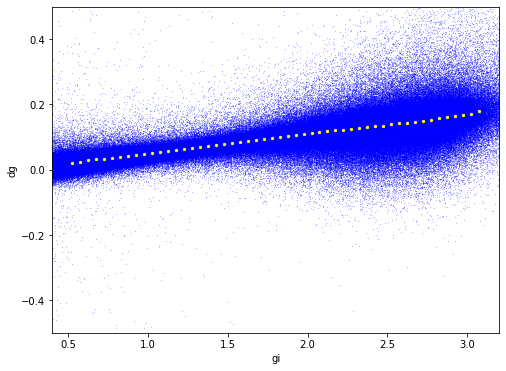

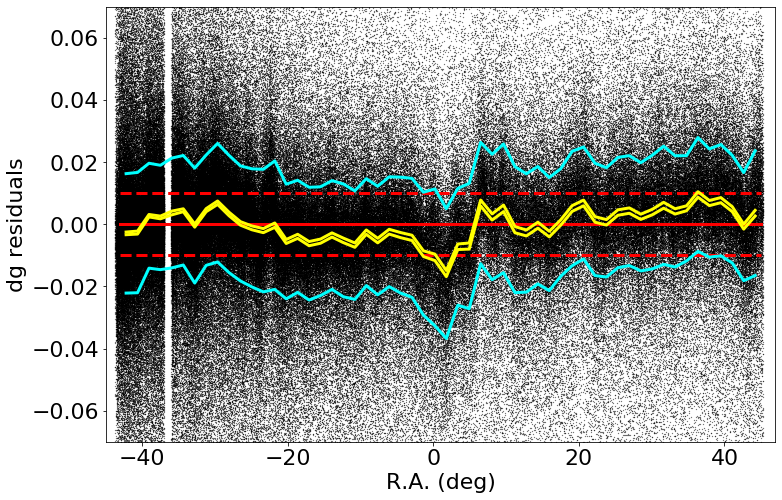

made plot colorResidDES2_dg_RA.png
-----------
 stats for Dec binning medians:
medianAll: -2.5311999997487677e-05 std.dev.All: 0.019621495639203967
N= 553173 min= -0.2995947187999985 max= 0.2999683655999973
median: 0.00036226079999852195 std.dev: 0.0016211719423759197
saved plot as: colorResidDES2_dg_Dec.png


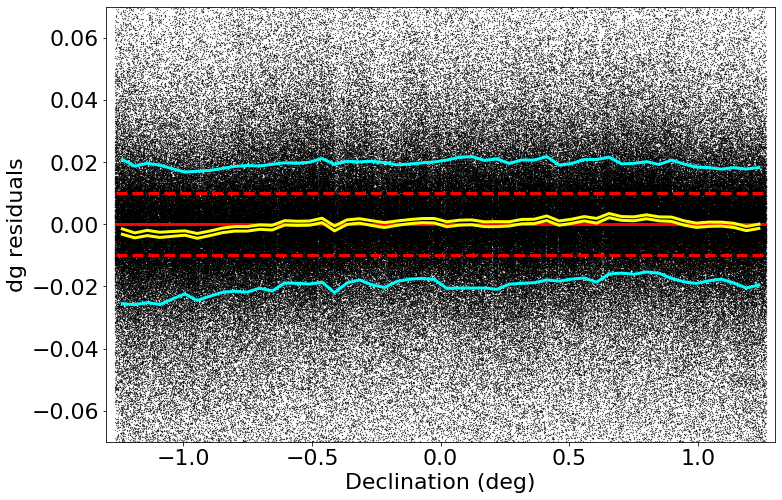

made plot colorResidDES2_dg_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -2.5311999997487677e-05 std.dev.All: 0.019621495639203967
N= 553173 min= -0.2995947187999985 max= 0.2999683655999973
median: 0.0015209881000003561 std.dev: 0.006902963499303118
saved plot as: colorResidDES2_dg_rmag.png


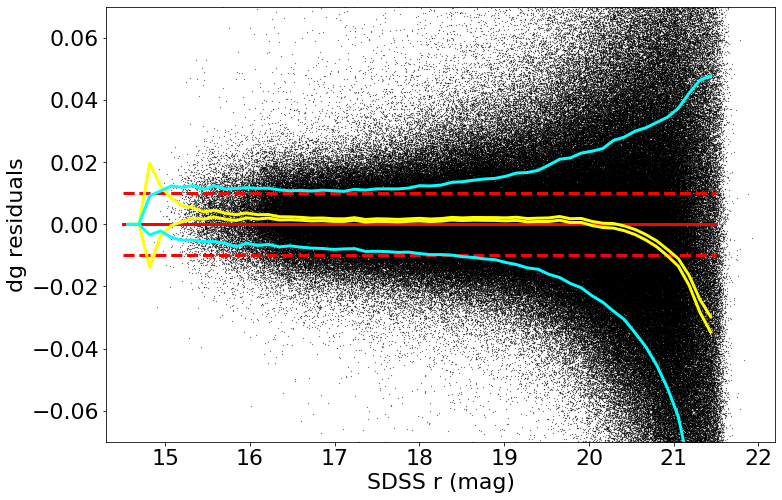

made plot colorResidDES2_dg_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -7.924499999374668e-06 std.dev.All: 0.014160313060725042
N= 553818 min= -0.2998677199999968 max= 0.2977909729000034
median: -0.0008023122749981296 std.dev: 0.004123580704736485
saved plot as: colorResidDES2_dr_RA.png


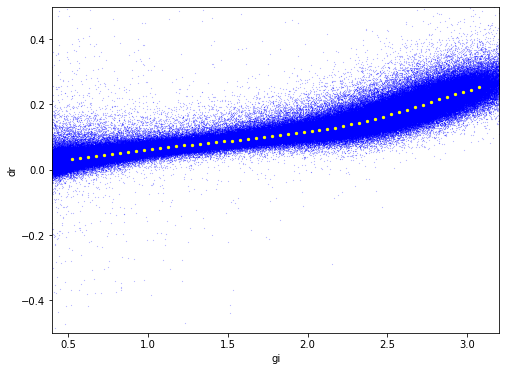

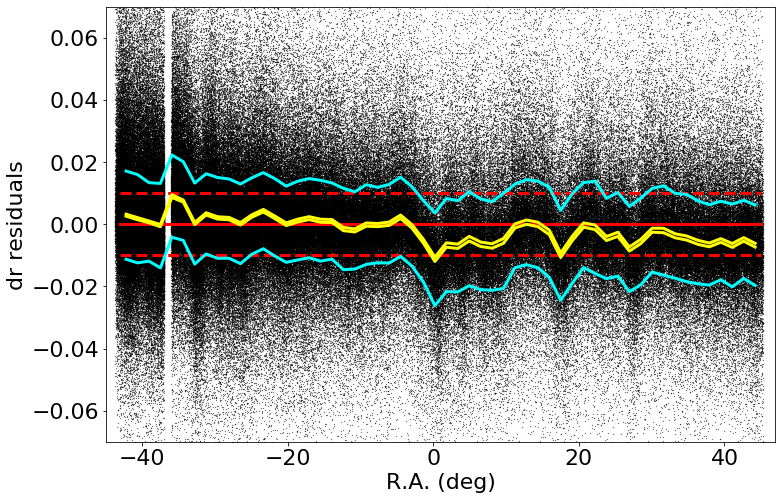

made plot colorResidDES2_dr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -7.924499999374668e-06 std.dev.All: 0.014160313060725042
N= 553818 min= -0.2998677199999968 max= 0.2977909729000034
median: -5.9957199999859795e-05 std.dev: 0.000934624963099911
saved plot as: colorResidDES2_dr_Dec.png


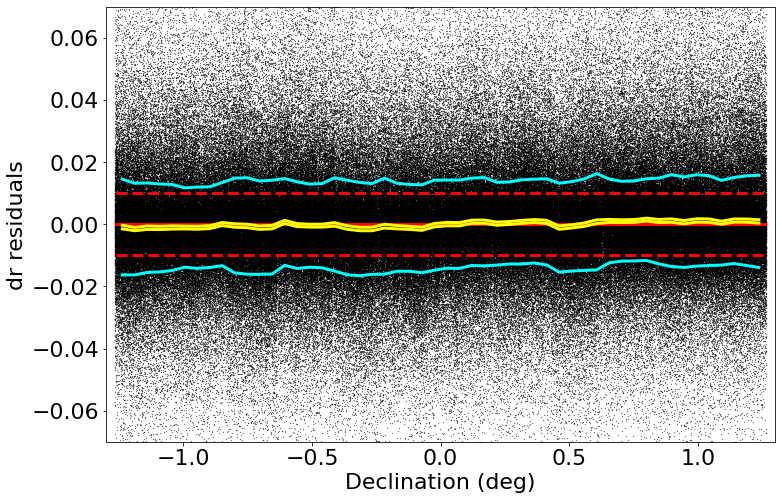

made plot colorResidDES2_dr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.924499999374668e-06 std.dev.All: 0.014160313060725042
N= 553818 min= -0.2998677199999968 max= 0.2977909729000034
median: -0.001059953999999183 std.dev: 0.002651643484054687
saved plot as: colorResidDES2_dr_rmag.png


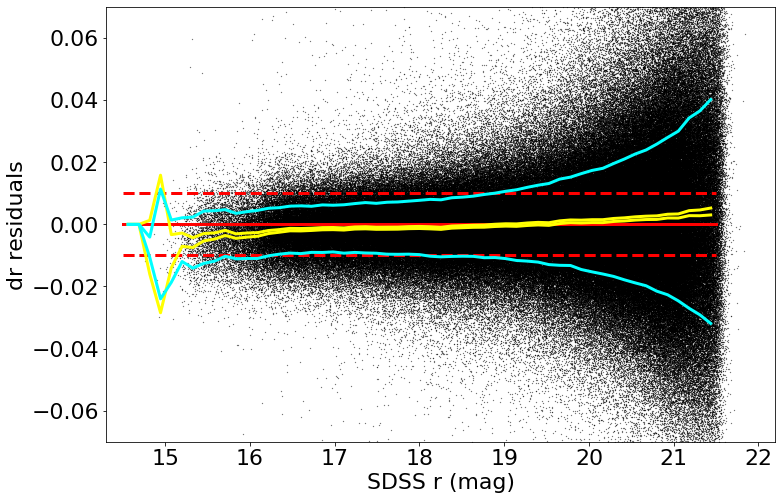

made plot colorResidDES2_dr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -1.7485600000040347e-05 std.dev.All: 0.014606826007803315
N= 553836 min= -0.29931587320000097 max= 0.2995738580000033
median: -0.00262726990000035 std.dev: 0.0060507171451944786
saved plot as: colorResidDES2_di_RA.png


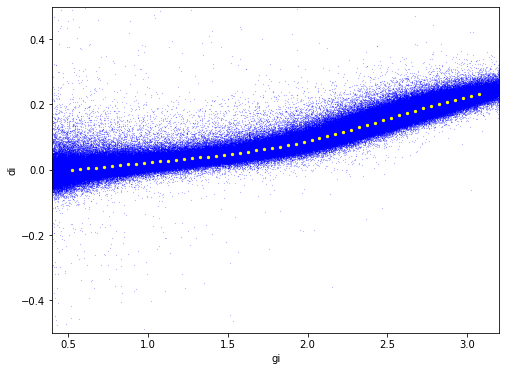

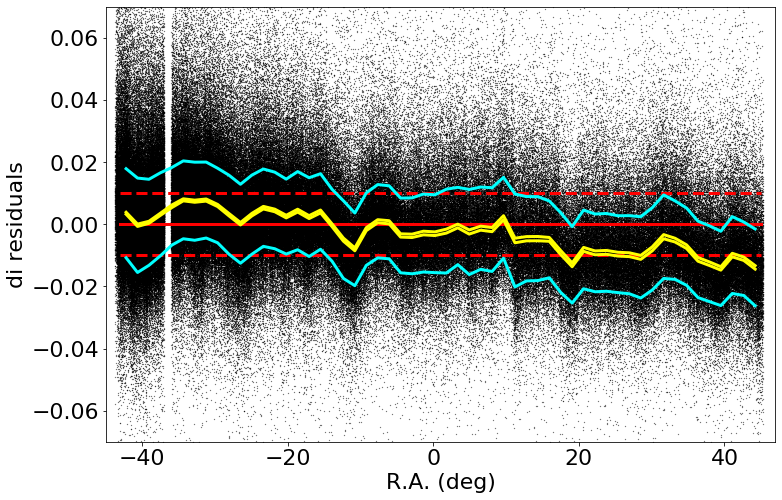

made plot colorResidDES2_di_RA.png
-----------
 stats for Dec binning medians:
medianAll: -1.7485600000040347e-05 std.dev.All: 0.014606826007803315
N= 553836 min= -0.29931587320000097 max= 0.2995738580000033
median: 5.551399999834464e-05 std.dev: 0.0014580005735547357
saved plot as: colorResidDES2_di_Dec.png


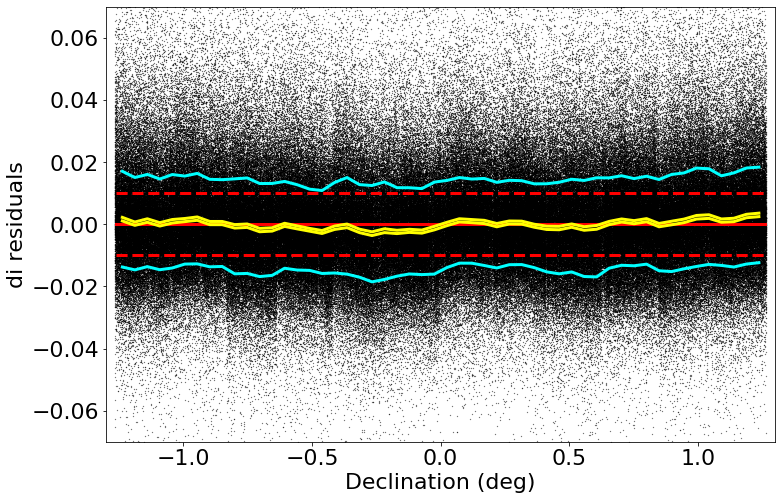

made plot colorResidDES2_di_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.7485600000040347e-05 std.dev.All: 0.014606826007803315
N= 553836 min= -0.29931587320000097 max= 0.2995738580000033
median: -0.0014351224000005163 std.dev: 0.003819047003320709
saved plot as: colorResidDES2_di_rmag.png


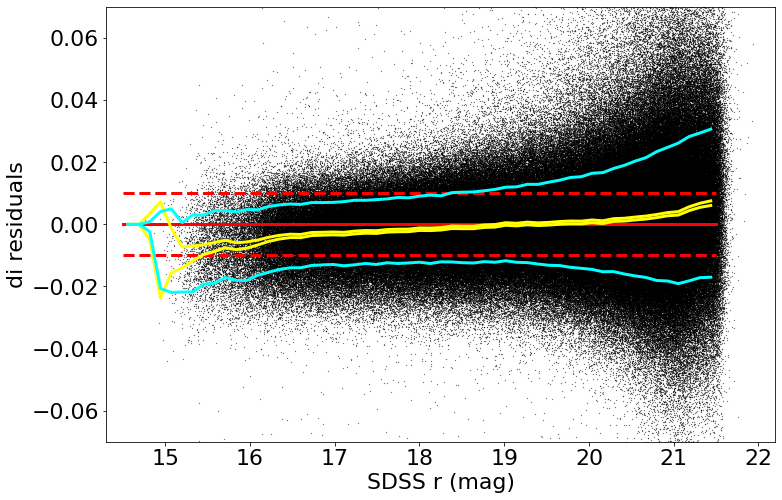

made plot colorResidDES2_di_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -3.1615499995691146e-06 std.dev.All: 0.023070426638999032
N= 553582 min= -0.29991204629999857 max= 0.2998935628999999
median: -0.003524217800000337 std.dev: 0.012344070323086037
saved plot as: colorResidDES2_dz_RA.png


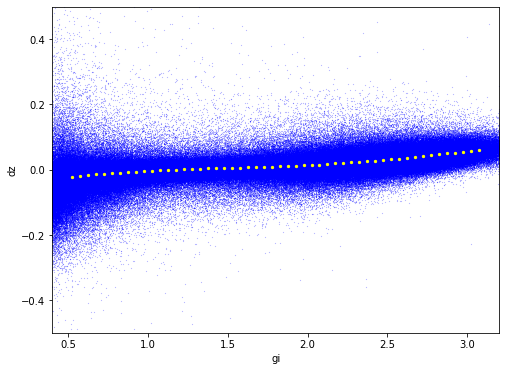

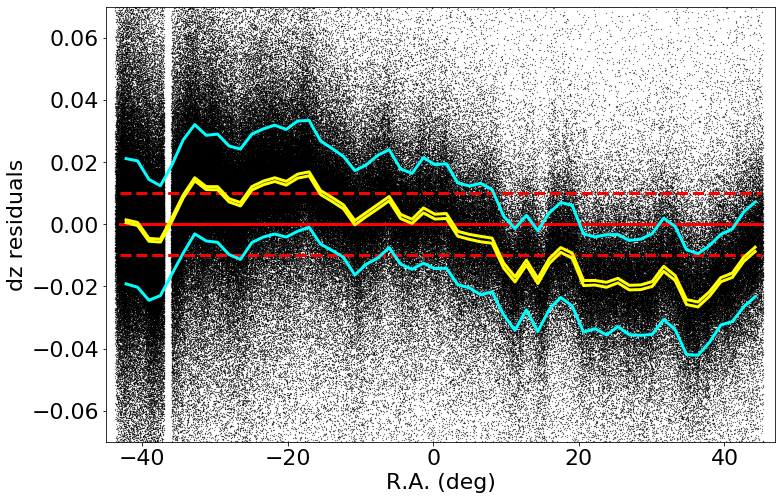

made plot colorResidDES2_dz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -3.1615499995691146e-06 std.dev.All: 0.023070426638999032
N= 553582 min= -0.29991204629999857 max= 0.2998935628999999
median: 0.0004423463500001464 std.dev: 0.0033492863529312506
saved plot as: colorResidDES2_dz_Dec.png


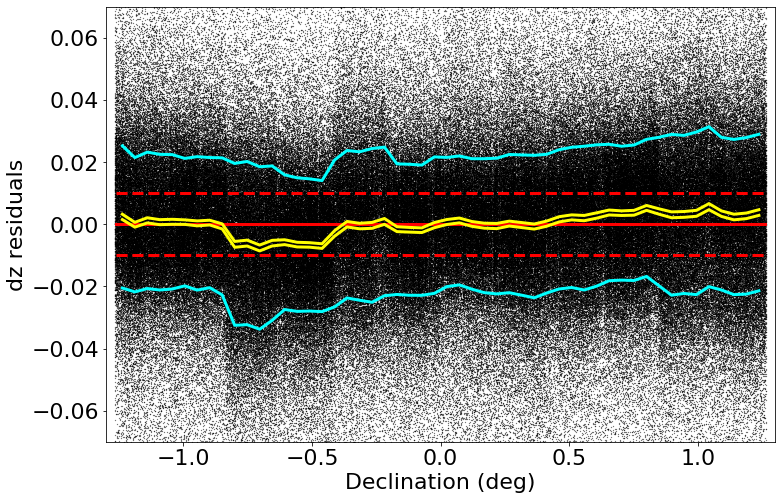

made plot colorResidDES2_dz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -3.1615499995691146e-06 std.dev.All: 0.023070426638999032
N= 553582 min= -0.29991204629999857 max= 0.2998935628999999
median: 0.0012947984999992284 std.dev: 0.004811781869585092
saved plot as: colorResidDES2_dz_rmag.png


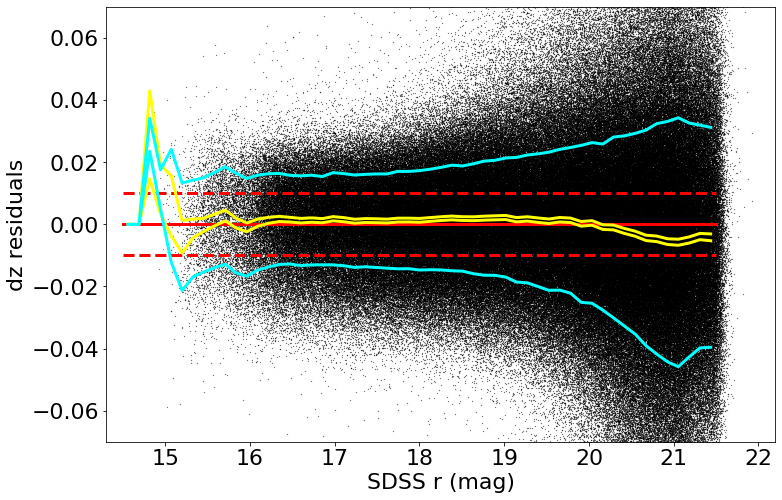

made plot colorResidDES2_dz_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: -6.204000000226053e-06 std.dev.All: 0.02341236195967519
N= 553504 min= -0.2996853277999988 max= 0.2987198429000013
median: -8.562054999973825e-05 std.dev: 0.006508570468041544
saved plot as: colorResidDES2_dgr_RA.png


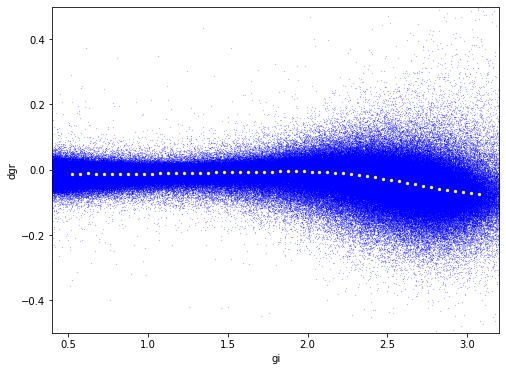

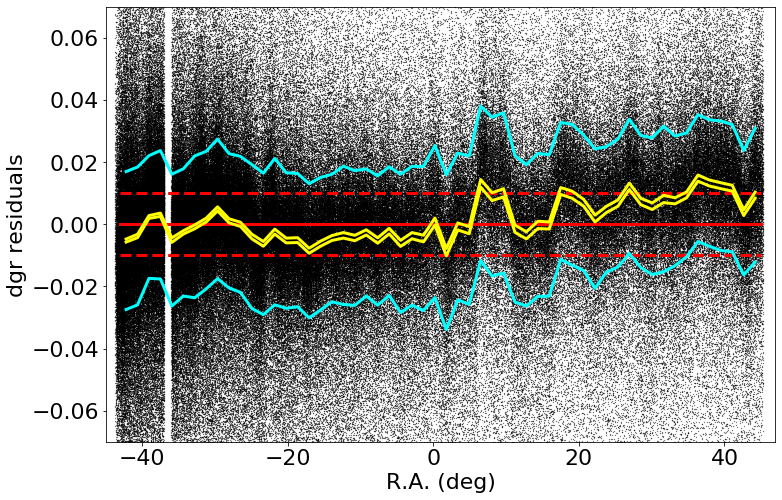

made plot colorResidDES2_dgr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -6.204000000226053e-06 std.dev.All: 0.02341236195967519
N= 553504 min= -0.2996853277999988 max= 0.2987198429000013
median: 0.0002522297249997682 std.dev: 0.0015590160556553782
saved plot as: colorResidDES2_dgr_Dec.png


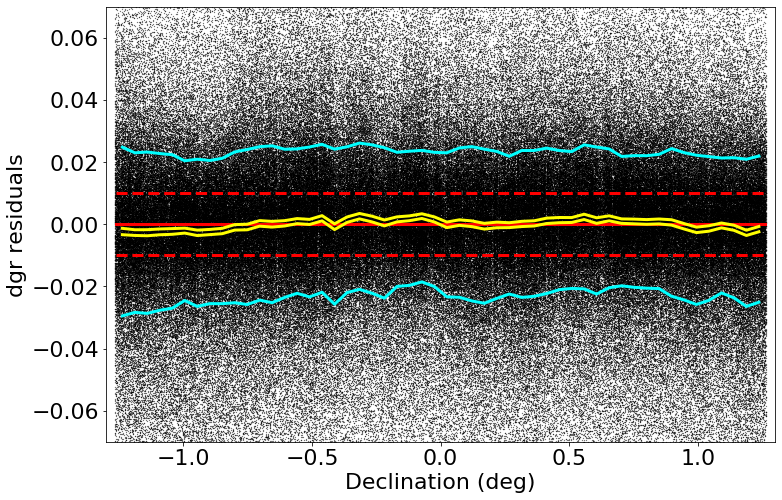

made plot colorResidDES2_dgr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -6.204000000226053e-06 std.dev.All: 0.02341236195967519
N= 553504 min= -0.2996853277999988 max= 0.2987198429000013
median: 0.0022134717999994884 std.dev: 0.008604653305238331
saved plot as: colorResidDES2_dgr_rmag.png


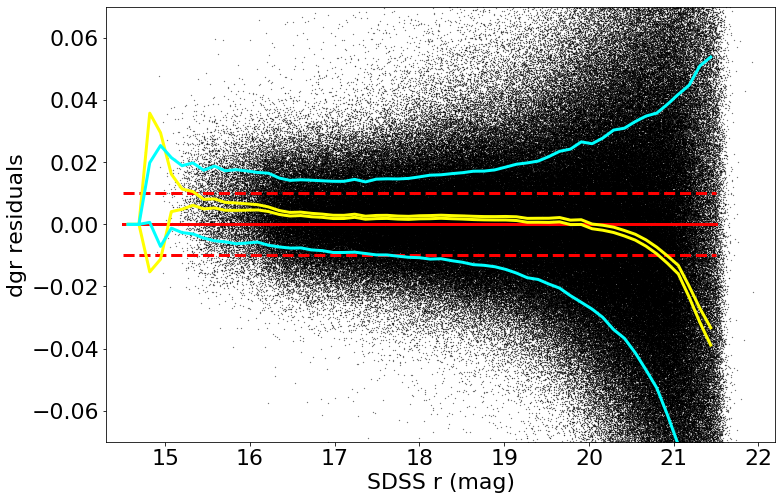

made plot colorResidDES2_dgr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -5.571999999454125e-06 std.dev.All: 0.015730139770802256
N= 553925 min= -0.28735097880000005 max= 0.28988440800000115
median: 0.0012239399749956132 std.dev: 0.004565355943687325
saved plot as: colorResidDES2_dri_RA.png


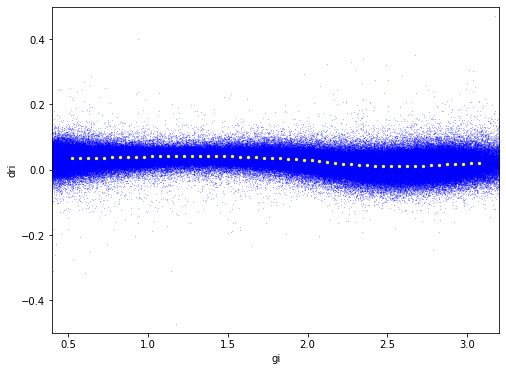

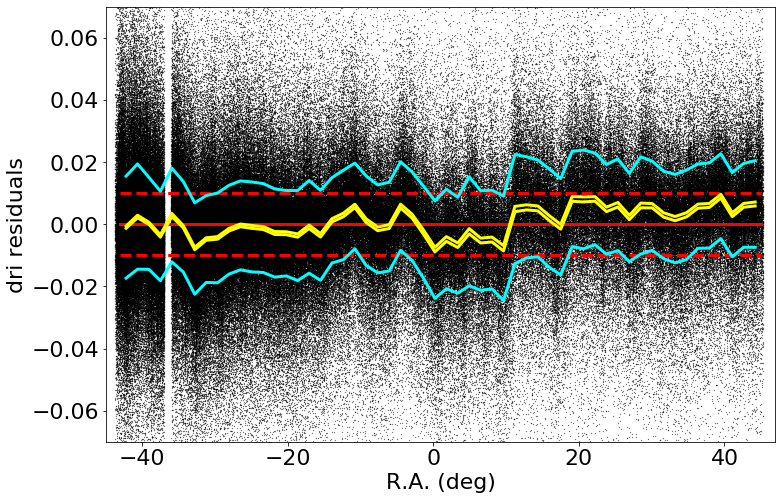

made plot colorResidDES2_dri_RA.png
-----------
 stats for Dec binning medians:
medianAll: -5.571999999454125e-06 std.dev.All: 0.015730139770802256
N= 553925 min= -0.28735097880000005 max= 0.28988440800000115
median: 0.00015169870000136983 std.dev: 0.0011422163684702768
saved plot as: colorResidDES2_dri_Dec.png


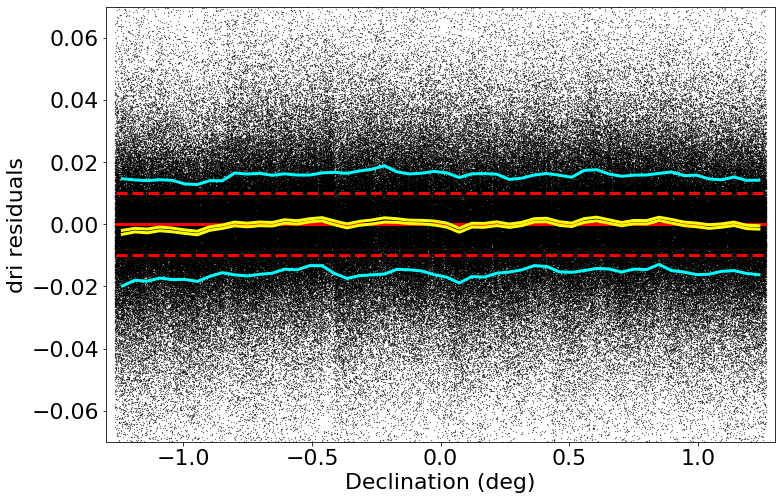

made plot colorResidDES2_dri_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -5.571999999454125e-06 std.dev.All: 0.015730139770802256
N= 553925 min= -0.28735097880000005 max= 0.28988440800000115
median: -7.845250000034984e-05 std.dev: 0.001926999640258508
saved plot as: colorResidDES2_dri_rmag.png


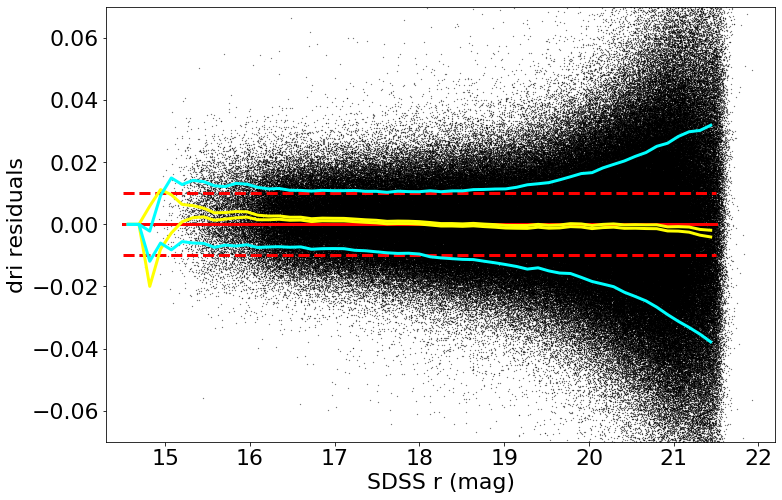

made plot colorResidDES2_dri_rmag.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: 1.7584499998821168e-06 std.dev.All: 0.021752418349348383
N= 553746 min= -0.29965358419999755 max= 0.29620945000000276
median: 0.00013240332499984617 std.dev: 0.0083827421387529
saved plot as: colorResidDES2_diz_RA.png


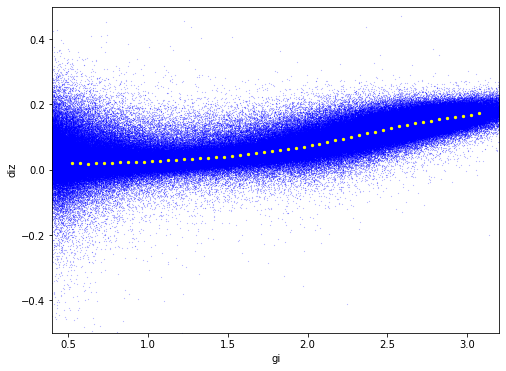

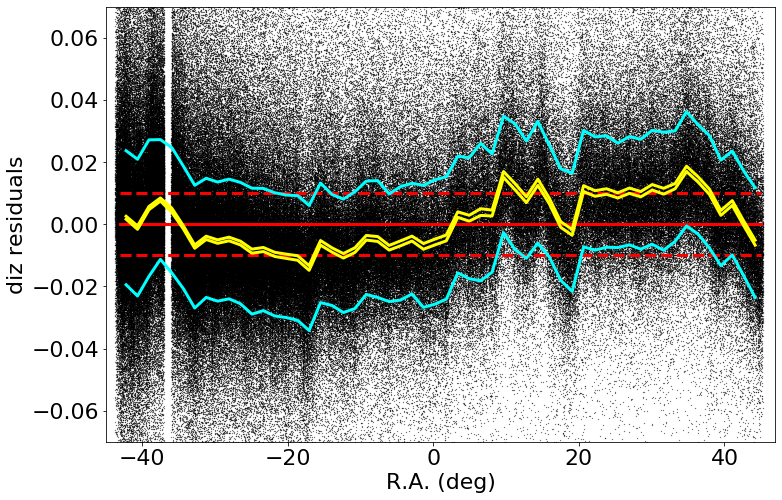

made plot colorResidDES2_diz_RA.png
-----------
 stats for Dec binning medians:
medianAll: 1.7584499998821168e-06 std.dev.All: 0.021752418349348383
N= 553746 min= -0.29965358419999755 max= 0.29620945000000276
median: -0.0003487200000020334 std.dev: 0.002387391718474887
saved plot as: colorResidDES2_diz_Dec.png


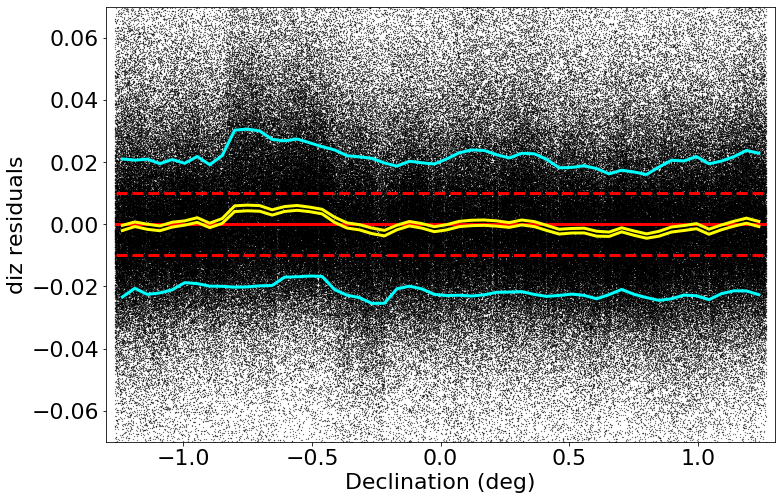

made plot colorResidDES2_diz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 1.7584499998821168e-06 std.dev.All: 0.021752418349348383
N= 553746 min= -0.29965358419999755 max= 0.29620945000000276
median: -0.002326465400000883 std.dev: 0.006593810912556697
saved plot as: colorResidDES2_diz_rmag.png


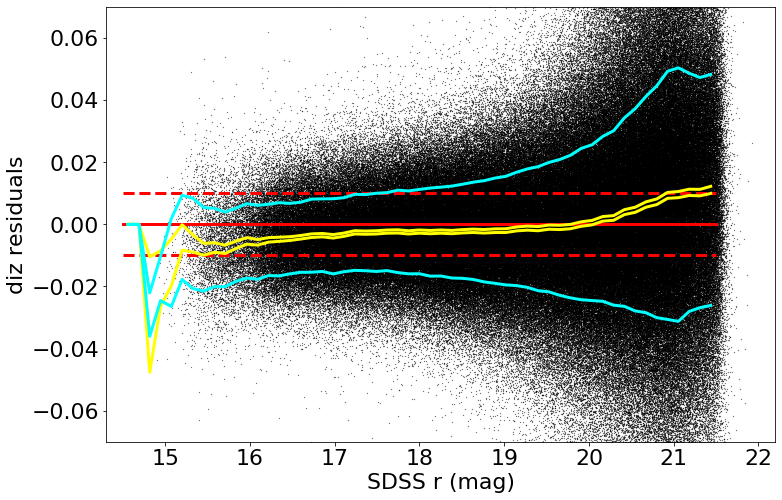

made plot colorResidDES2_diz_rmag.png
------------------------------------------------------------------


In [18]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES2_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDES, keywords)

=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -1.3095800001264313e-05 std.dev.All: 0.01236915509699952
N= 303345 min= -0.27967832820000027 max= 0.2991639512000006
median: 0.00016160164999891834 std.dev: 0.005033182471659474
saved plot as: colorResidDES2bright_dg_RA.png


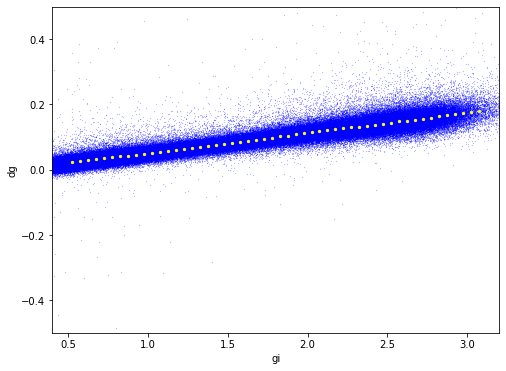

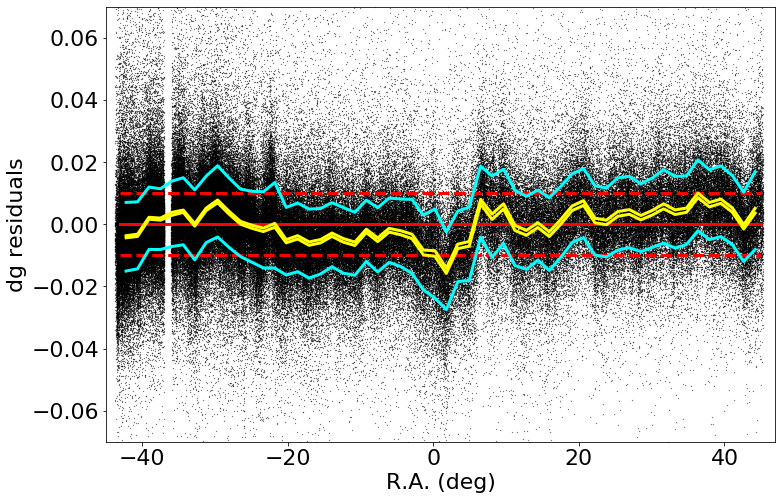

made plot colorResidDES2bright_dg_RA.png
-----------
 stats for Dec binning medians:
medianAll: -1.3095800001264313e-05 std.dev.All: 0.01236915509699952
N= 303345 min= -0.27967832820000027 max= 0.2991639512000006
median: 0.0001800206999998319 std.dev: 0.001466523654345324
saved plot as: colorResidDES2bright_dg_Dec.png


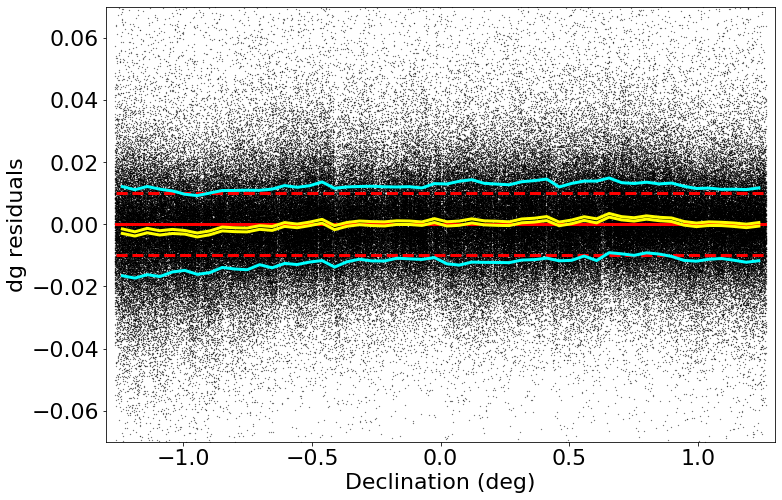

made plot colorResidDES2bright_dg_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.3095800001264313e-05 std.dev.All: 0.01236915509699952
N= 303345 min= -0.27967832820000027 max= 0.2991639512000006
median: -1.5075075001107566e-05 std.dev: 0.0012911573052261645
saved plot as: colorResidDES2bright_dg_rmag.png


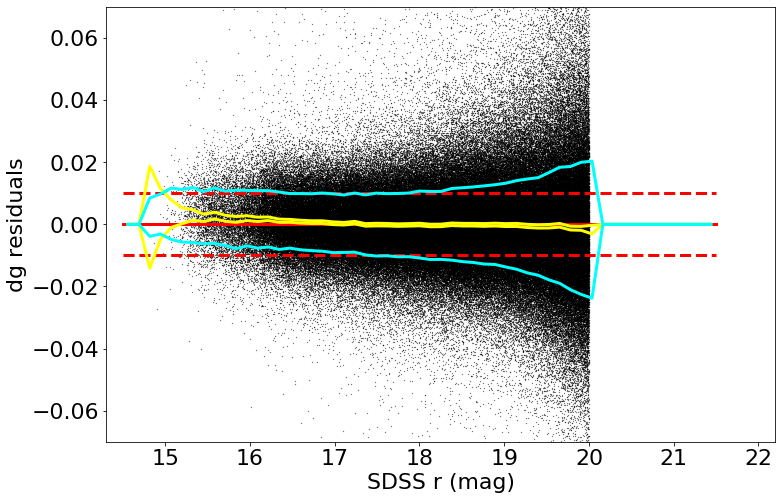

made plot colorResidDES2bright_dg_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -1.941130000196467e-05 std.dev.All: 0.009936819484797346
N= 303376 min= -0.29786586479999666 max= 0.29513365800000213
median: -0.001000627599999901 std.dev: 0.003947949028412402
saved plot as: colorResidDES2bright_dr_RA.png


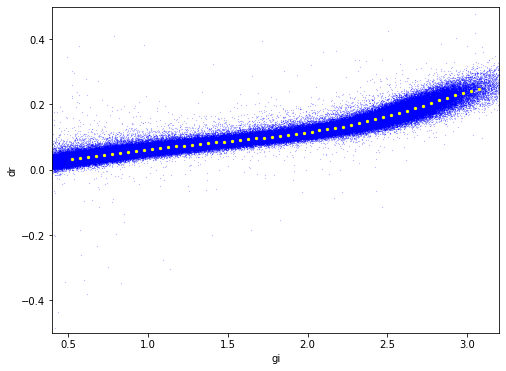

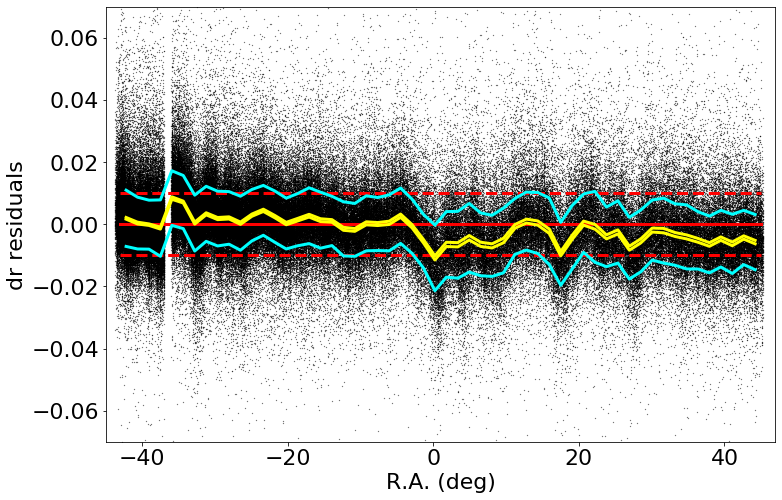

made plot colorResidDES2bright_dr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -1.941130000196467e-05 std.dev.All: 0.009936819484797346
N= 303376 min= -0.29786586479999666 max= 0.29513365800000213
median: 9.704895000218518e-05 std.dev: 0.0007284337619182232
saved plot as: colorResidDES2bright_dr_Dec.png


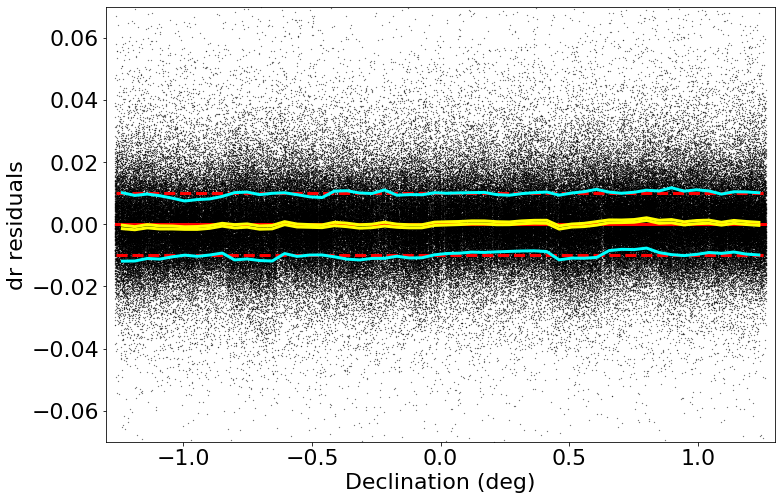

made plot colorResidDES2bright_dr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.941130000196467e-05 std.dev.All: 0.009936819484797346
N= 303376 min= -0.29786586479999666 max= 0.29513365800000213
median: -0.0005564114499980975 std.dev: 0.0024357092333573173
saved plot as: colorResidDES2bright_dr_rmag.png


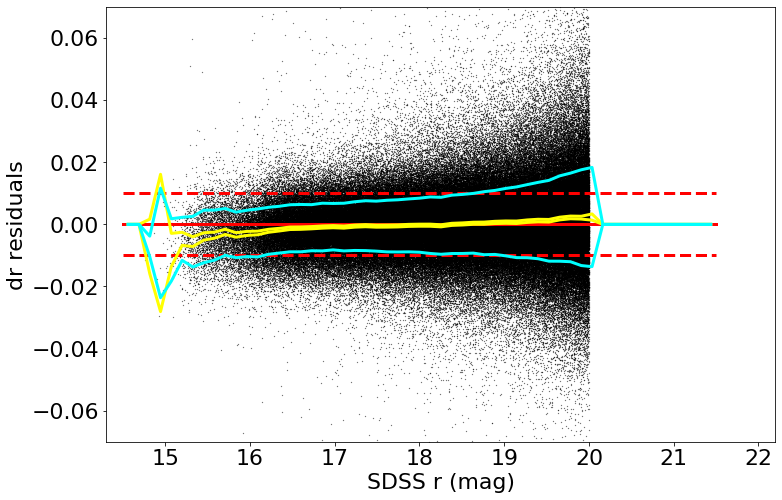

made plot colorResidDES2bright_dr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -7.843200000218209e-06 std.dev.All: 0.011526798745800286
N= 303381 min= -0.2961721863999982 max= 0.2837124626999976
median: -0.0028059093500005477 std.dev: 0.006075576554921443
saved plot as: colorResidDES2bright_di_RA.png


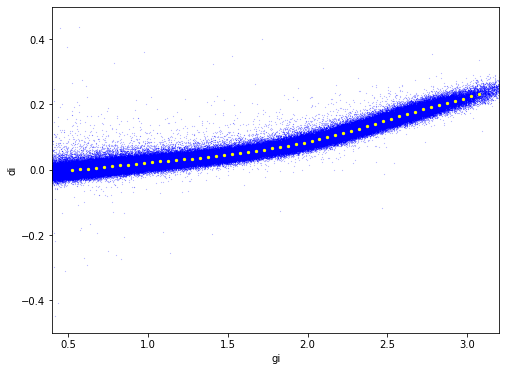

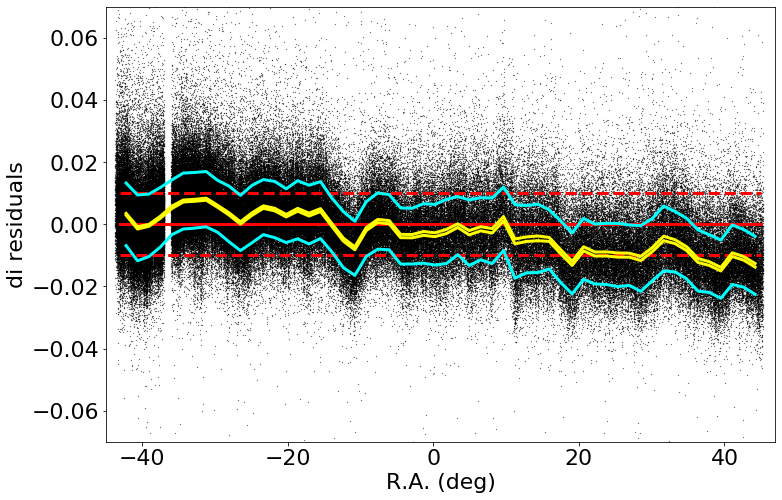

made plot colorResidDES2bright_di_RA.png
-----------
 stats for Dec binning medians:
medianAll: -7.843200000218209e-06 std.dev.All: 0.011526798745800286
N= 303381 min= -0.2961721863999982 max= 0.2837124626999976
median: -2.0535299999300052e-05 std.dev: 0.000985290283146514
saved plot as: colorResidDES2bright_di_Dec.png


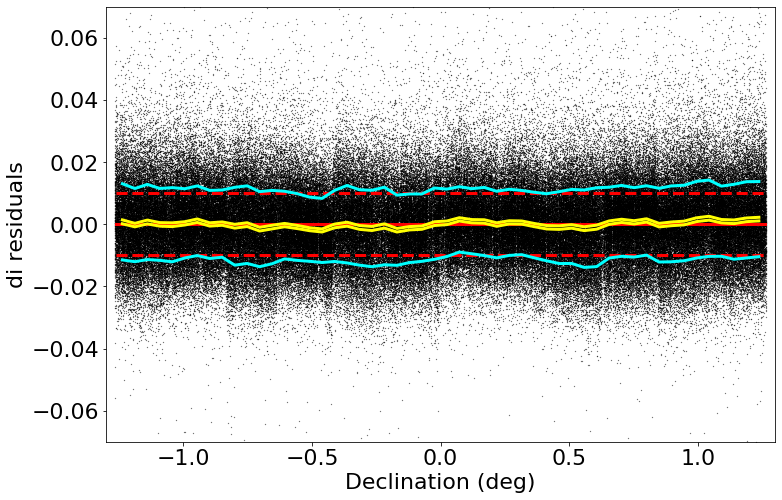

made plot colorResidDES2bright_di_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.843200000218209e-06 std.dev.All: 0.011526798745800286
N= 303381 min= -0.2961721863999982 max= 0.2837124626999976
median: -0.0010826132000003649 std.dev: 0.003576220642862169
saved plot as: colorResidDES2bright_di_rmag.png


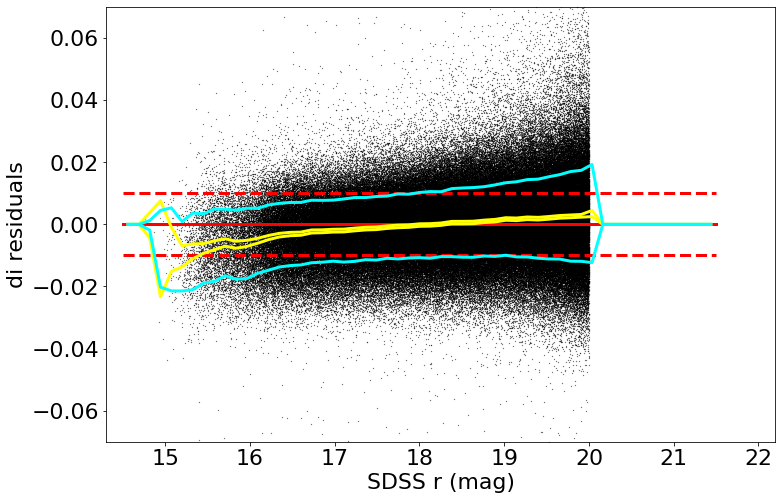

made plot colorResidDES2bright_di_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -7.397399994543696e-06 std.dev.All: 0.017720299008748986
N= 303359 min= -0.29233687260000146 max= 0.2999552840000014
median: -0.0041587564500004115 std.dev: 0.012070206775235176
saved plot as: colorResidDES2bright_dz_RA.png


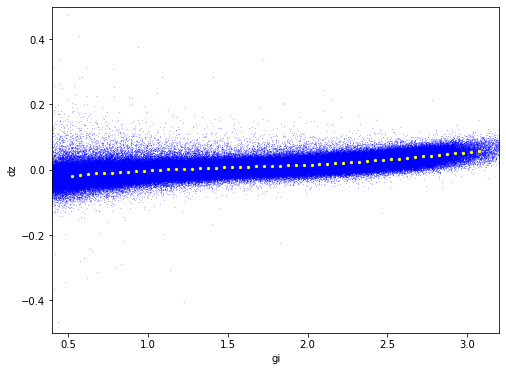

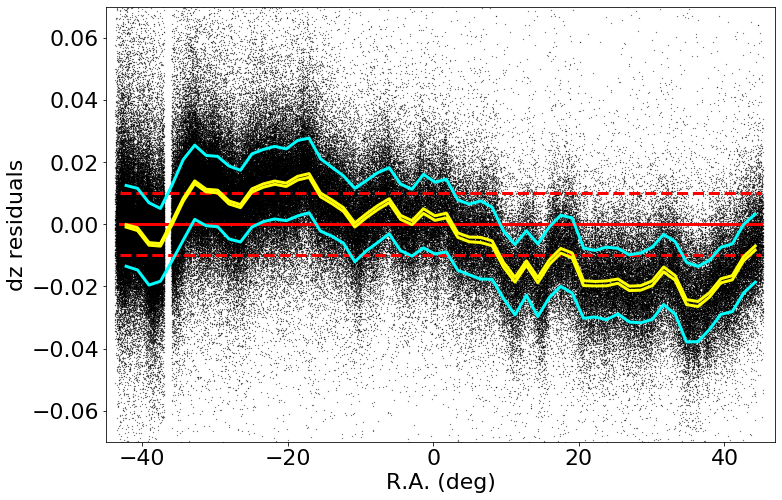

made plot colorResidDES2bright_dz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -7.397399994543696e-06 std.dev.All: 0.017720299008748986
N= 303359 min= -0.29233687260000146 max= 0.2999552840000014
median: 0.0003980442500017252 std.dev: 0.0021606665334472953
saved plot as: colorResidDES2bright_dz_Dec.png


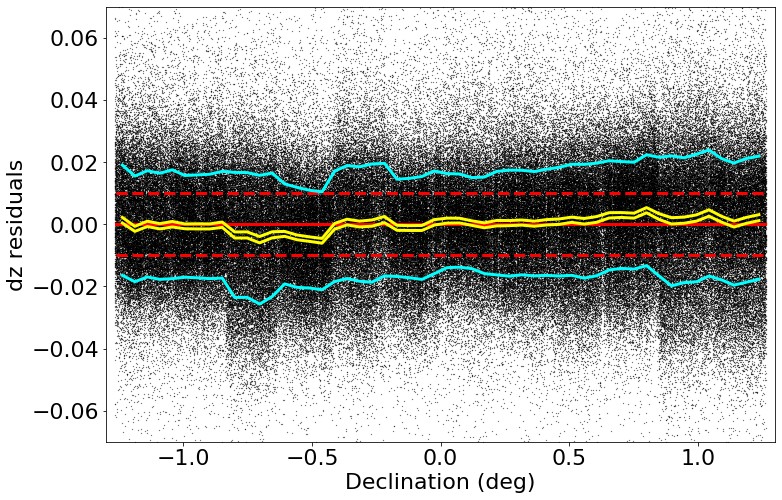

made plot colorResidDES2bright_dz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.397399994543696e-06 std.dev.All: 0.017720299008748986
N= 303359 min= -0.29233687260000146 max= 0.2999552840000014
median: -0.0001342870000006932 std.dev: 0.00457940603481445
saved plot as: colorResidDES2bright_dz_rmag.png


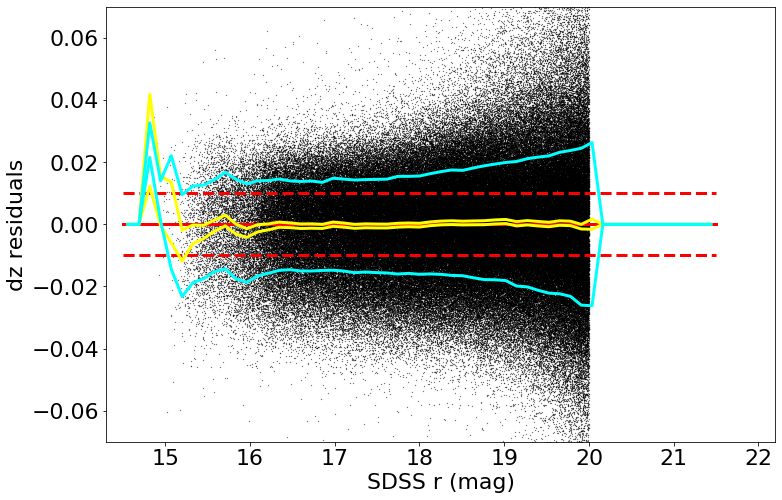

made plot colorResidDES2bright_dz_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: 1.3838999985962483e-06 std.dev.All: 0.014935362029246169
N= 303372 min= -0.2773266198999981 max= 0.294310020999998
median: 0.00011212952499950598 std.dev: 0.006352621522455605
saved plot as: colorResidDES2bright_dgr_RA.png


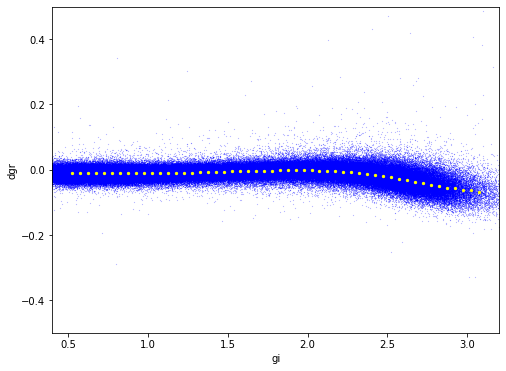

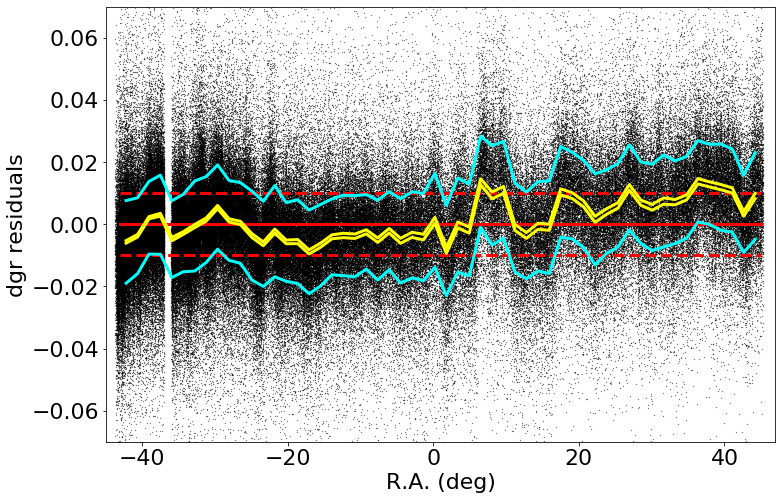

made plot colorResidDES2bright_dgr_RA.png
-----------
 stats for Dec binning medians:
medianAll: 1.3838999985962483e-06 std.dev.All: 0.014935362029246169
N= 303372 min= -0.2773266198999981 max= 0.294310020999998
median: 0.00021727489999823164 std.dev: 0.0012032379326482523
saved plot as: colorResidDES2bright_dgr_Dec.png


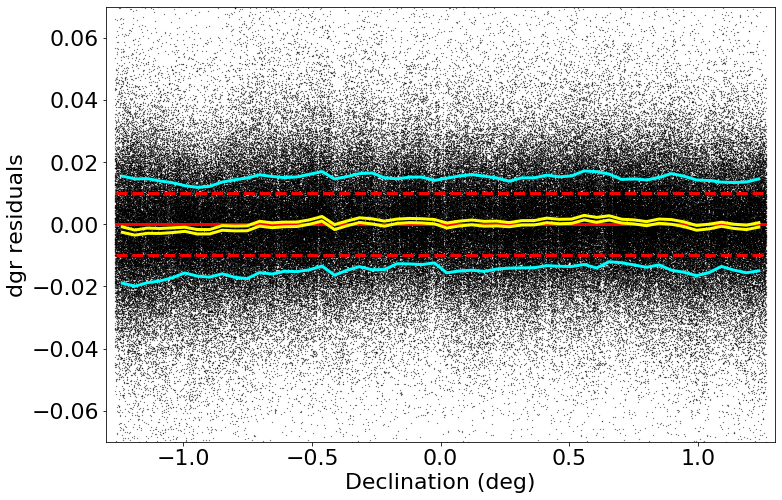

made plot colorResidDES2bright_dgr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 1.3838999985962483e-06 std.dev.All: 0.014935362029246169
N= 303372 min= -0.2773266198999981 max= 0.294310020999998
median: 0.00027650259999995367 std.dev: 0.003340099705574648
saved plot as: colorResidDES2bright_dgr_rmag.png


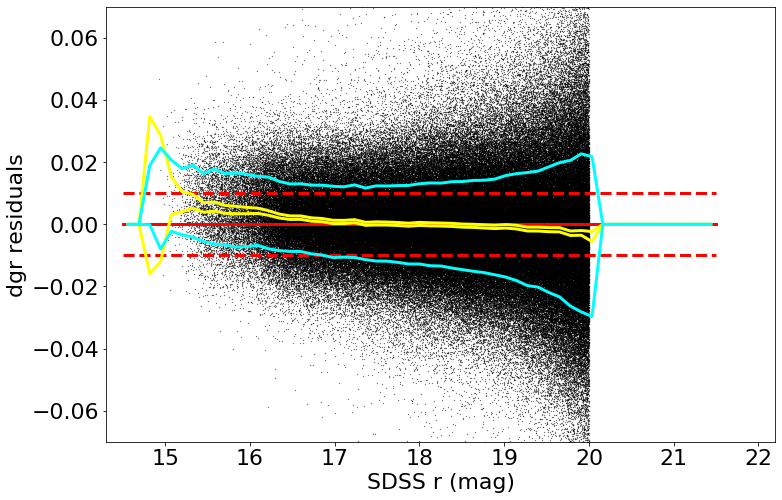

made plot colorResidDES2bright_dgr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -4.217200000322663e-06 std.dev.All: 0.011490878474399025
N= 303386 min= -0.2737219006000015 max= 0.2882748419999971
median: 0.0013200724749997533 std.dev: 0.004671819852053813
saved plot as: colorResidDES2bright_dri_RA.png


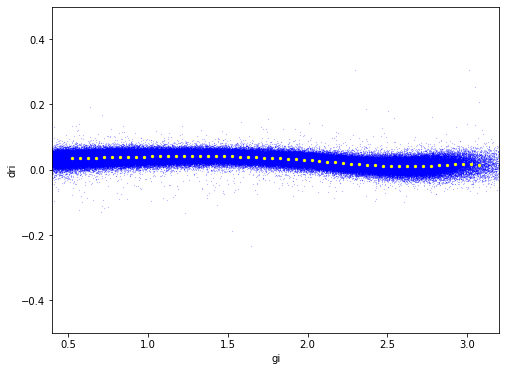

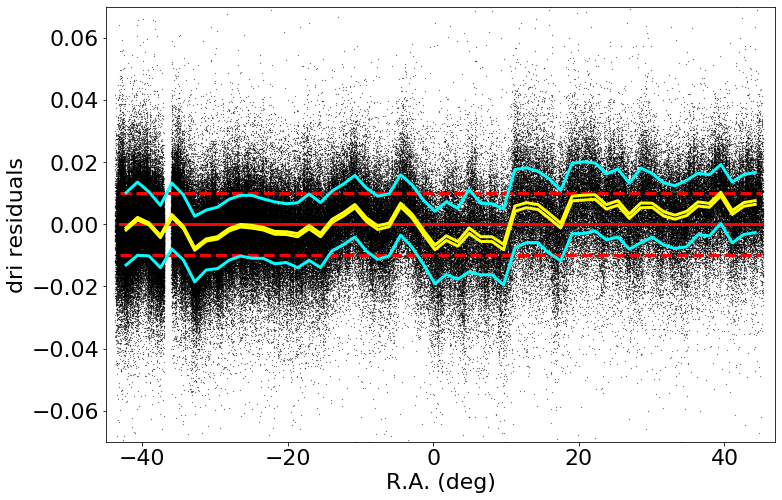

made plot colorResidDES2bright_dri_RA.png
-----------
 stats for Dec binning medians:
medianAll: -4.217200000322663e-06 std.dev.All: 0.011490878474399025
N= 303386 min= -0.2737219006000015 max= 0.2882748419999971
median: 6.466740000118584e-05 std.dev: 0.0008879086381114661
saved plot as: colorResidDES2bright_dri_Dec.png


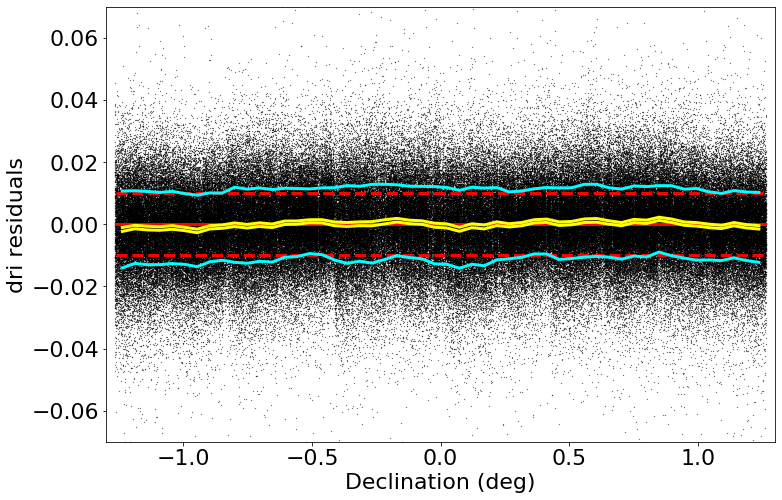

made plot colorResidDES2bright_dri_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -4.217200000322663e-06 std.dev.All: 0.011490878474399025
N= 303386 min= -0.2737219006000015 max= 0.2882748419999971
median: 0.00044215869999997097 std.dev: 0.001960556773232271
saved plot as: colorResidDES2bright_dri_rmag.png


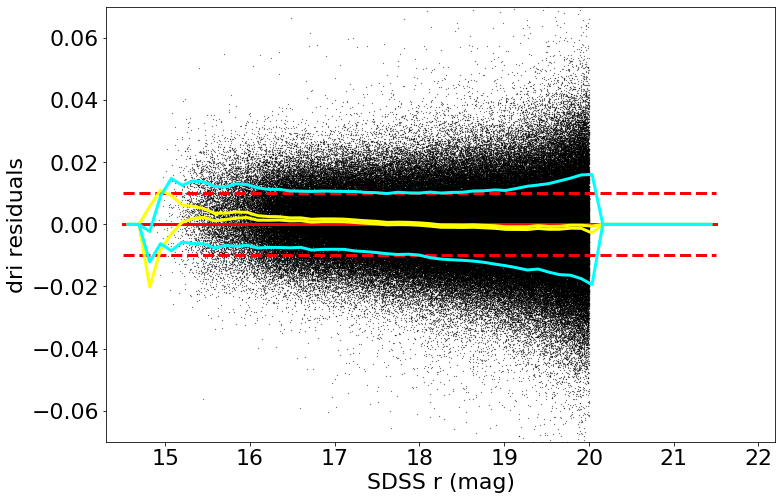

made plot colorResidDES2bright_dri_rmag.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: -1.1724150002175027e-05 std.dev.All: 0.015598900964401028
N= 303366 min= -0.28021268059999743 max= 0.17942128000000057
median: 0.0003142329999988938 std.dev: 0.00799014110447552
saved plot as: colorResidDES2bright_diz_RA.png


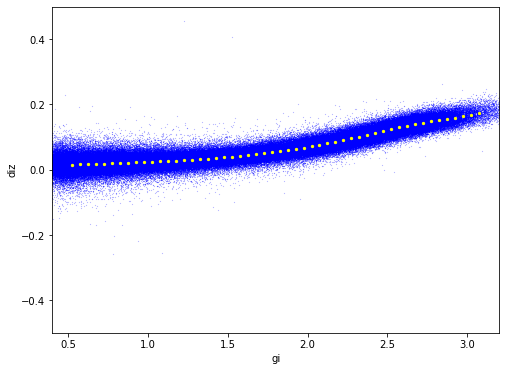

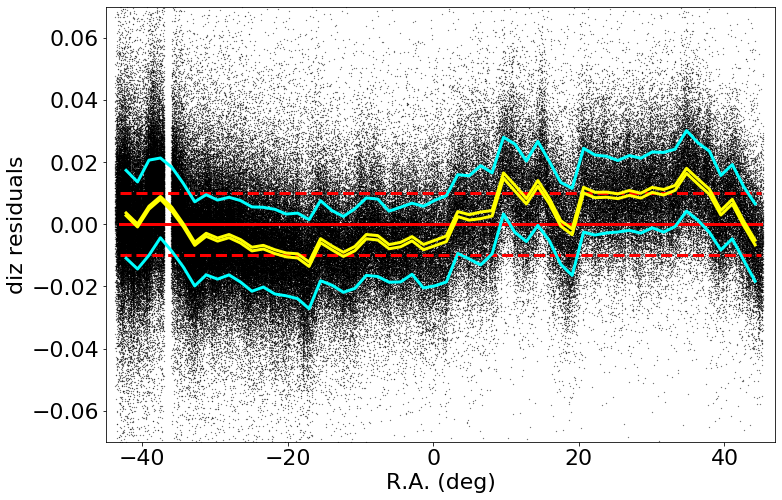

made plot colorResidDES2bright_diz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -1.1724150002175027e-05 std.dev.All: 0.015598900964401028
N= 303366 min= -0.28021268059999743 max= 0.17942128000000057
median: -0.0002505770000013731 std.dev: 0.0014813947555741493
saved plot as: colorResidDES2bright_diz_Dec.png


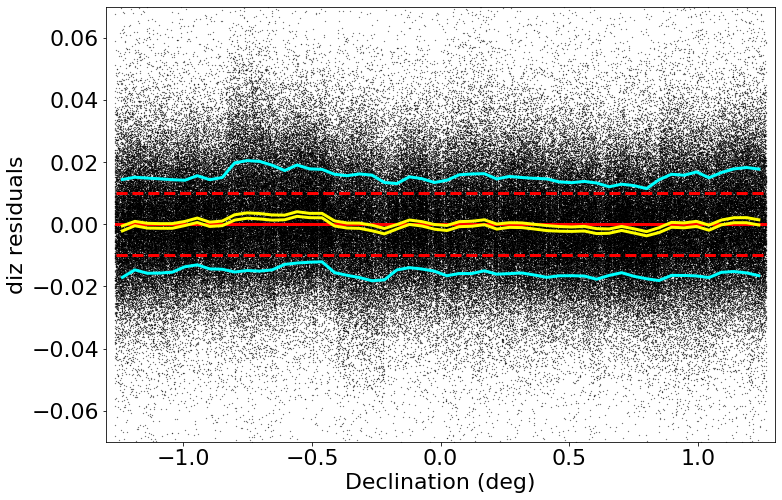

made plot colorResidDES2bright_diz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.1724150002175027e-05 std.dev.All: 0.015598900964401028
N= 303366 min= -0.28021268059999743 max= 0.17942128000000057
median: -0.0002580855749978036 std.dev: 0.005183927808321154
saved plot as: colorResidDES2bright_diz_rmag.png


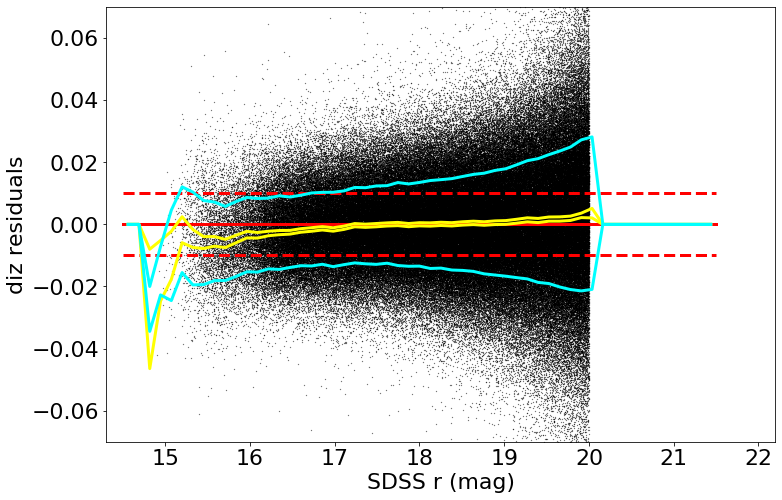

made plot colorResidDES2bright_diz_rmag.png
------------------------------------------------------------------


In [19]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES2bright_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDESbright, keywords)